# Deep Dream : Inception V3
This jupyter notebook contains an implementation of DeepDream, a technique by Alexander Mordvintsev. <br>

Following things are covered:
<ol>
<li>Getting Data</li>
<li>Model Building</li>
</ol>

In [1]:
# import libraries
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random 
import scipy.ndimage as nd
import warnings
import time
from PIL import Image
warnings.filterwarnings('ignore')

In [2]:
# use GPU
physical_devices = tf.config.experimental.list_physical_devices('GPU')
assert len(physical_devices) > 0, "Not enough GPU hardware devices available"
tf.config.experimental.set_memory_growth(physical_devices[0], True)

In [3]:
# load model
inception_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')

# summary
inception_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, None, None, 3 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, None, None, 3 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, None, None, 3 0           batch_normalization[0][0]        
_______________________________________________________________________________________

In [4]:
# Maximize the activations of these layers
beg_names = ['mixed1','mixed2']     #Beginning of network
mid_names = ['mixed3','mixed5']     #Mid of network
end_names = ['mixed9','mixed10']    #End of network

In [5]:
# Layers
layers = [inception_model.get_layer(name).output for name in mid_names]

# Create the feature extraction model
deepdream_inception_model = tf.keras.Model(inputs=inception_model.input, outputs=layers)

In [6]:
def calc_loss(image, model):
# Function used for loss calculations
# It works by feedforwarding the input image through the network and generate activations
# Then obtain the average and sum of those outputs

  img_batch = tf.expand_dims(image, axis=0) # Convert into batch format
  layer_activations = model(img_batch) # Run the model
  print('ACTIVATION VALUES (LAYER OUTPUT) =\n', layer_activations)
  # print('ACTIVATION SHAPE =\n', np.shape(layer_activations))

  losses = [] # accumulator to hold all the losses
  for act in layer_activations:
    loss = tf.math.reduce_mean(act) # calculate mean of each activation 
    losses.append(loss)
  
  print('LOSSES (FROM MULTIPLE ACTIVATION LAYERS) = ', losses)
  print('LOSSES SHAPE (FROM MULTIPLE ACTIVATION LAYERS) = ', np.shape(losses))
  print('SUM OF ALL LOSSES (FROM ALL SELECTED LAYERS)= ', tf.reduce_sum(losses))

  return  tf.reduce_sum(losses) # Calculate sum 

In [7]:
@tf.function
def deepdream(model, image, step_size):
    with tf.GradientTape() as tape:
      # This needs gradients relative to `img`
      # `GradientTape` only watches `tf.Variable`s by default
      tape.watch(image)
      loss = calc_loss(image, model) # call the function that calculate the loss 

    # Calculate the gradient of the loss with respect to the pixels of the input image.
    # The syntax is as follows: dy_dx = g.gradient(y, x) 
    gradients = tape.gradient(loss, image)

    print('GRADIENTS =\n', gradients)
    print('GRADIENTS SHAPE =\n', np.shape(gradients))

    # tf.math.reduce_std computes the standard deviation of elements across dimensions of a tensor
    gradients /= tf.math.reduce_std(gradients)  

    # In gradient ascent, the "loss" is maximized so that the input image increasingly "excites" the layers.
    # You can update the image by directly adding the gradients (because they're the same shape!)
    
    image = image + gradients * step_size
    
    image = tf.clip_by_value(image, -1, 1)

    return loss, image

In [8]:
def deprocess(image):
  image = 255*(image + 1.0)/2.0
  return tf.cast(image, tf.uint8)

In [19]:
def run_deep_dream_simple(model, image, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  h, w = image.shape[:2]
  s = 0.05 # scale coefficient
  image = tf.keras.applications.inception_v3.preprocess_input(image)
  
  for step in range(steps):
    img = nd.affine_transform(image, [1-s,1-s,1], [h*s/2,w*s/2,0], order=2)
    #if step % 100 == 0 and step != 0 :
        #img = tf.constant(np.array(img))
        #base_shape = tf.shape(img)[:-1]

        #float_base_shape = tf.cast(base_shape, tf.float32)
        #new_shape = tf.cast(float_base_shape*(4**2), tf.int32)
        #img = tf.image.resize(img, new_shape).numpy()
        #img = tf.image.central_crop(img, 0.5).numpy()
        #img = tf.image.resize(img, base_shape).numpy()
    loss, image = deepdream(model, img, step_size)
    
    if step % 100 == 0:
      plt.figure(figsize=(12,12))
      plt.imshow(deprocess(image))
      plt.show()
      print ("Step {}, loss {}".format(step, loss))

  # clear_output(wait=True)
  plt.figure(figsize=(12,12))
  plt.imshow(deprocess(image))
  plt.show()

  return deprocess(image)

-5
ACTIVATION VALUES (LAYER OUTPUT) =
 [<tf.Tensor 'model_2/mixed3/concat:0' shape=(1, 11, 18, 768) dtype=float32>, <tf.Tensor 'model_2/mixed5/concat:0' shape=(1, 11, 18, 768) dtype=float32>]
LOSSES (FROM MULTIPLE ACTIVATION LAYERS) =  [<tf.Tensor 'Mean:0' shape=() dtype=float32>, <tf.Tensor 'Mean_1:0' shape=() dtype=float32>]
LOSSES SHAPE (FROM MULTIPLE ACTIVATION LAYERS) =  (2,)
SUM OF ALL LOSSES (FROM ALL SELECTED LAYERS)=  Tensor("Sum:0", shape=(), dtype=float32)
GRADIENTS =
 Tensor("gradient_tape/Reshape_3:0", shape=(209, 315, 3), dtype=float32)
GRADIENTS SHAPE =
 (209, 315, 3)


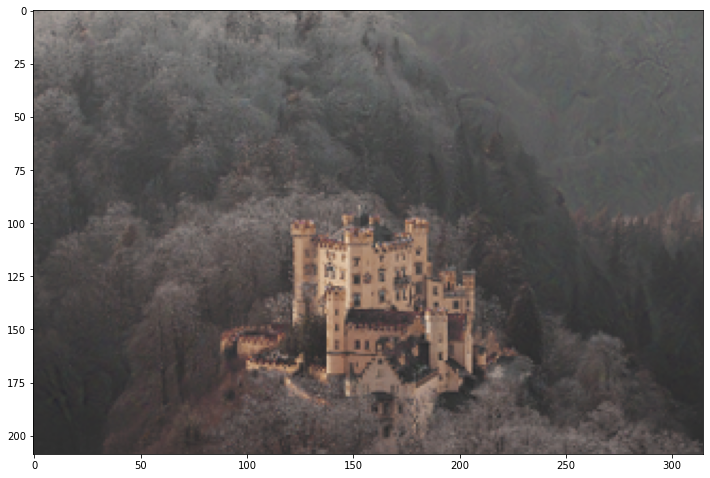

Step 0, loss 0.6171324849128723


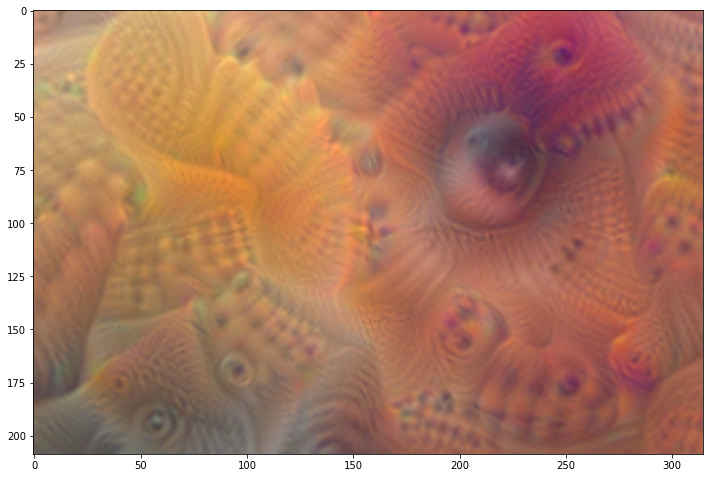

-4
ACTIVATION VALUES (LAYER OUTPUT) =
 [<tf.Tensor 'model_2/mixed3/concat:0' shape=(1, 12, 19, 768) dtype=float32>, <tf.Tensor 'model_2/mixed5/concat:0' shape=(1, 12, 19, 768) dtype=float32>]
LOSSES (FROM MULTIPLE ACTIVATION LAYERS) =  [<tf.Tensor 'Mean:0' shape=() dtype=float32>, <tf.Tensor 'Mean_1:0' shape=() dtype=float32>]
LOSSES SHAPE (FROM MULTIPLE ACTIVATION LAYERS) =  (2,)
SUM OF ALL LOSSES (FROM ALL SELECTED LAYERS)=  Tensor("Sum:0", shape=(), dtype=float32)
GRADIENTS =
 Tensor("gradient_tape/Reshape_3:0", shape=(230, 346, 3), dtype=float32)
GRADIENTS SHAPE =
 (230, 346, 3)


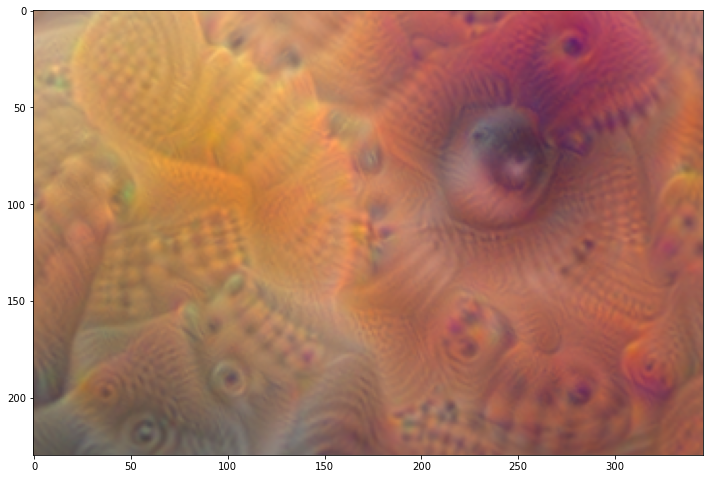

Step 0, loss 0.8527278900146484


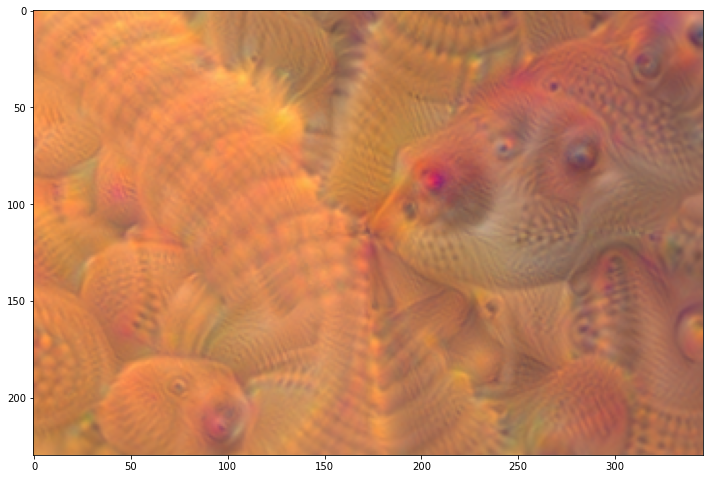

-3
ACTIVATION VALUES (LAYER OUTPUT) =
 [<tf.Tensor 'model_2/mixed3/concat:0' shape=(1, 14, 22, 768) dtype=float32>, <tf.Tensor 'model_2/mixed5/concat:0' shape=(1, 14, 22, 768) dtype=float32>]
LOSSES (FROM MULTIPLE ACTIVATION LAYERS) =  [<tf.Tensor 'Mean:0' shape=() dtype=float32>, <tf.Tensor 'Mean_1:0' shape=() dtype=float32>]
LOSSES SHAPE (FROM MULTIPLE ACTIVATION LAYERS) =  (2,)
SUM OF ALL LOSSES (FROM ALL SELECTED LAYERS)=  Tensor("Sum:0", shape=(), dtype=float32)
GRADIENTS =
 Tensor("gradient_tape/Reshape_3:0", shape=(253, 381, 3), dtype=float32)
GRADIENTS SHAPE =
 (253, 381, 3)


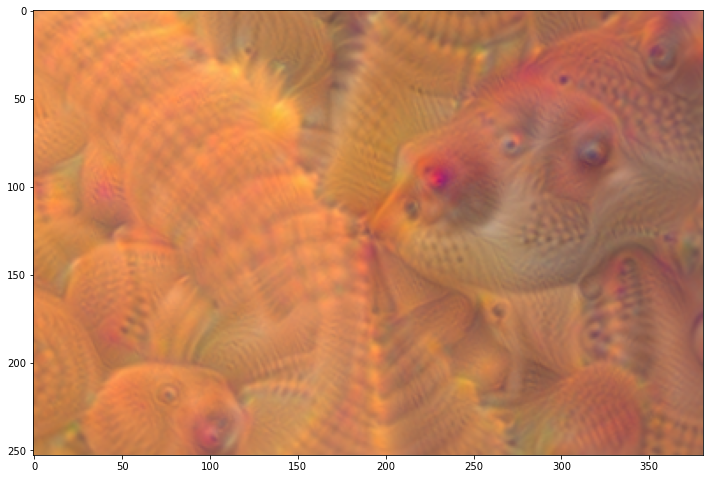

Step 0, loss 0.862107515335083


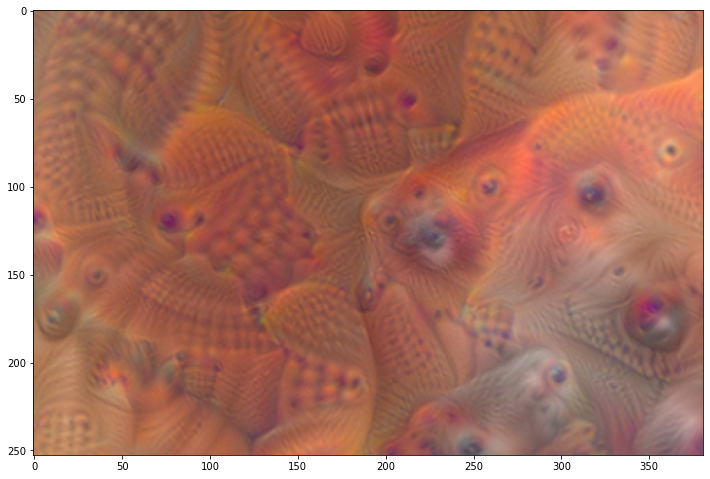

-2
ACTIVATION VALUES (LAYER OUTPUT) =
 [<tf.Tensor 'model_2/mixed3/concat:0' shape=(1, 15, 24, 768) dtype=float32>, <tf.Tensor 'model_2/mixed5/concat:0' shape=(1, 15, 24, 768) dtype=float32>]
LOSSES (FROM MULTIPLE ACTIVATION LAYERS) =  [<tf.Tensor 'Mean:0' shape=() dtype=float32>, <tf.Tensor 'Mean_1:0' shape=() dtype=float32>]
LOSSES SHAPE (FROM MULTIPLE ACTIVATION LAYERS) =  (2,)
SUM OF ALL LOSSES (FROM ALL SELECTED LAYERS)=  Tensor("Sum:0", shape=(), dtype=float32)
GRADIENTS =
 Tensor("gradient_tape/Reshape_3:0", shape=(279, 419, 3), dtype=float32)
GRADIENTS SHAPE =
 (279, 419, 3)


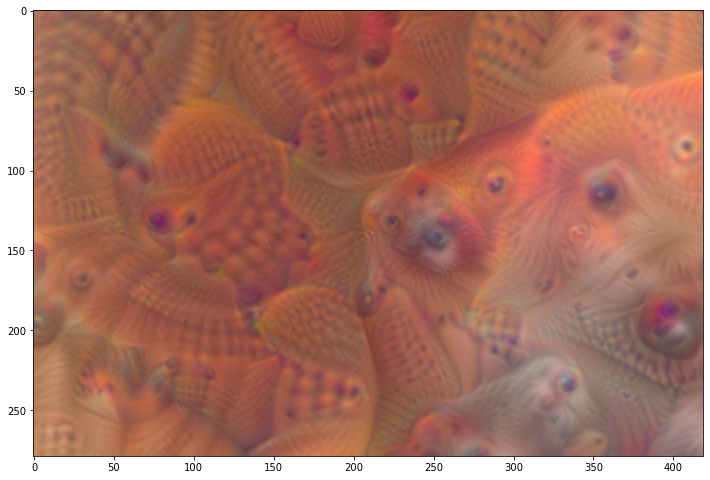

Step 0, loss 0.8512324094772339


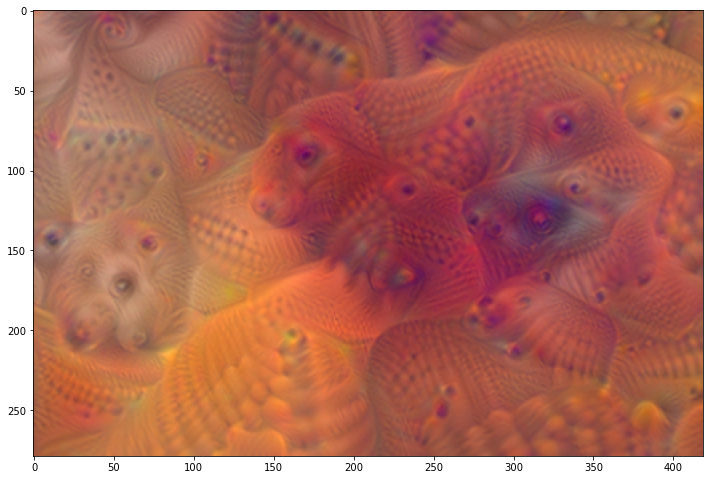

-1
ACTIVATION VALUES (LAYER OUTPUT) =
 [<tf.Tensor 'model_2/mixed3/concat:0' shape=(1, 17, 27, 768) dtype=float32>, <tf.Tensor 'model_2/mixed5/concat:0' shape=(1, 17, 27, 768) dtype=float32>]
LOSSES (FROM MULTIPLE ACTIVATION LAYERS) =  [<tf.Tensor 'Mean:0' shape=() dtype=float32>, <tf.Tensor 'Mean_1:0' shape=() dtype=float32>]
LOSSES SHAPE (FROM MULTIPLE ACTIVATION LAYERS) =  (2,)
SUM OF ALL LOSSES (FROM ALL SELECTED LAYERS)=  Tensor("Sum:0", shape=(), dtype=float32)
GRADIENTS =
 Tensor("gradient_tape/Reshape_3:0", shape=(307, 461, 3), dtype=float32)
GRADIENTS SHAPE =
 (307, 461, 3)


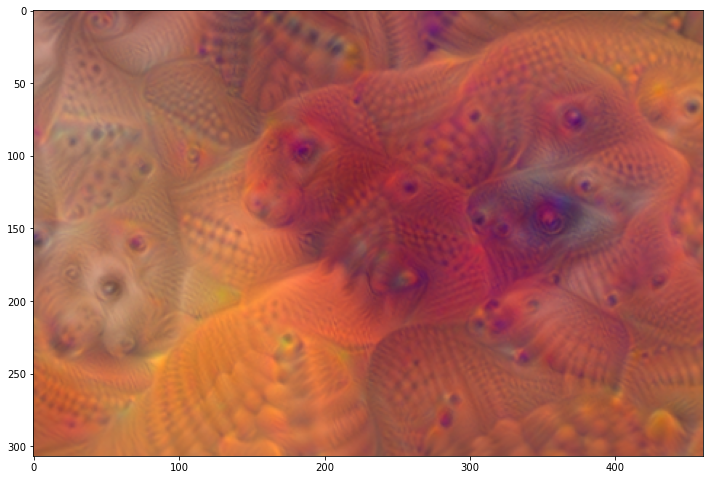

Step 0, loss 0.8504961729049683


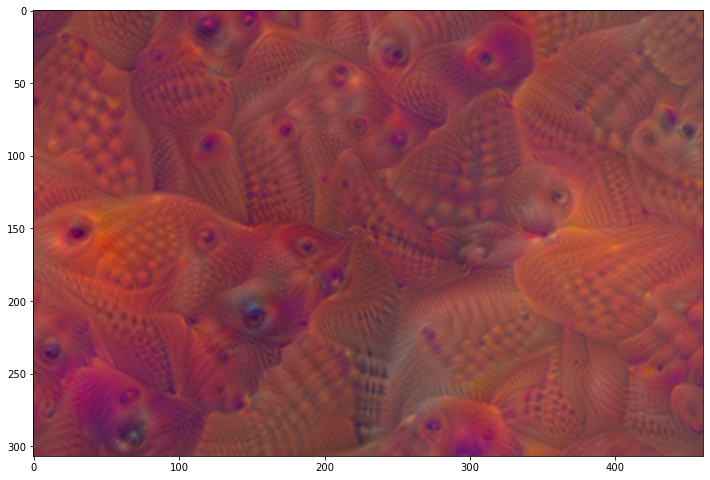

In [18]:
start = time.time()
OCTAVE_SCALE = 1.1
Sample_Image = tf.keras.preprocessing.image.load_img(r'./Images/Picture1.jpg', target_size = (338, 508))
img = tf.constant(np.array(Sample_Image))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-5, 0):
  print(n)
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)
  img = tf.image.resize(img, new_shape).numpy()
  img = run_deep_dream_simple(model=deepdream_inception_model, image=img, steps=100, step_size=0.01)

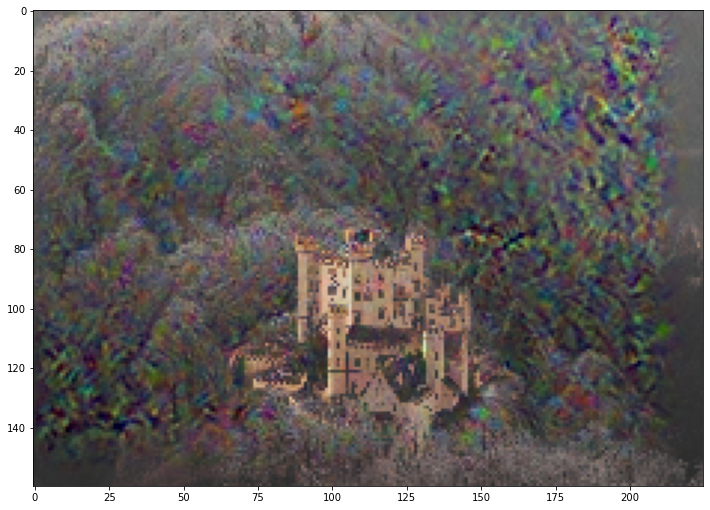

Step 0, loss 0.6645522117614746


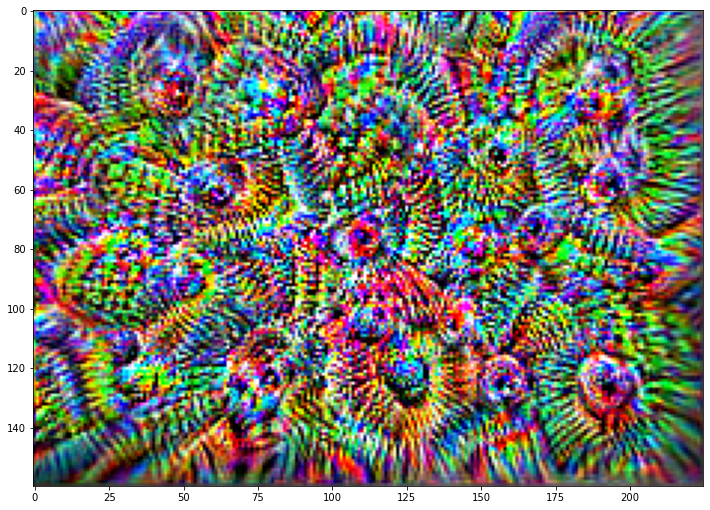

Step 100, loss 3.4395551681518555


KeyboardInterrupt: 

In [18]:
Sample_Image = tf.keras.preprocessing.image.load_img(r'./Images/Picture1.jpg', target_size = (160, 225))
Sample_Image = tf.keras.preprocessing.image.img_to_array(Sample_Image)
dream_img = run_deep_dream_simple(model=deepdream_inception_model, image=Sample_Image, 
                                  steps=1000, step_size=0.1)